In [1]:
import sys
sys.path.insert(0, '/home/users/mmuetz/deploy/wcrp_hackathon/scripts/convert_latlon_pp_to_hp_nc')
from processing_config import processing_config

/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)


In [123]:
sims = [
    'glm.n1280_CoMA9',
    'glm.n2560_RAL3p3',
    'glm.n1280_GAL9_nest',
    'SAmer_km4p4_RAL3P3.n1280_GAL9_nest',
    'Africa_km4p4_RAL3P3.n1280_GAL9_nest',
    'SEA_km4p4_RAL3P3.n1280_GAL9_nest',
    'SAmer_km4p4_CoMA9_TBv1.n1280_GAL9_nest',
    'Africa_km4p4_CoMA9_TBv1.n1280_GAL9_nest',
    'SEA_km4p4_CoMA9_TBv1.n1280_GAL9_nest',
    'CTC_km4p4_RAL3P3.n1280_GAL9_nest',
    'CTC_km4p4_CoMA9_TBv1.n1280_GAL9_nest'
]

In [63]:
import math as maths

import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

import easygems.healpix as egh

In [153]:
class Item:
    def __init__(self, url):
        self.url = url

    def to_dataset(self):
        return xr.open_zarr(self.url)

class Catalog:
    url_tpl = 'http://hackathon-o.s3.jc.rl.ac.uk/sim-data/dev/{sim}/v4/data.healpix.{freq}.z{zoom}.zarr'
    allowed_params = {
        'sim': sims,
        'freq': ['PT1H', 'PT3H'],
        'zoom': list(range(11)),
    }
    def __call__(self, **kwargs):
        for k, v in kwargs.items():
            if k not in self.allowed_params:
                raise Exception(f'Unknown param: {k}, must be one of {self.allowed_params.keys()}')
            if v not in self.allowed_params[k]:
                raise Exception(f'Unallowed param value: {v}, must be one of {self.allowed_params[k]}')
            
        return Item(self.url_tpl.format(**kwargs))

In [145]:
cat = Catalog()

In [152]:
ds = cat(sim='glm.n1280_GAL9_nest', freq='PT1H', zoom=9).to_dataset()

In [135]:
ds

<xarray.Dataset> Size: 792GB
Dimensions:  (cell: 786432, time: 10489)
Coordinates:
  * cell     (cell) int64 6MB 0 1 2 3 4 5 ... 786427 786428 786429 786430 786431
    crs      float64 8B ...
  * time     (time) datetime64[ns] 84kB 2020-01-20 ... 2021-04-01
Data variables: (12/24)
    clivi    (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    clt      (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    clwvi    (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    hflsd    (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    hfssd    (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    huss     (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    ...       ...
    rsut     (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    rsutcs   (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    tas      (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    ts       (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    uas      (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
    vas      (time, cell) float32 33GB dask.array<chunksize=(16, 65536), meta=np.ndarray>
Attributes:
    Met Office DYAMOND3 simulations:  A group of experiments have been conduc...
    bounds:                           {'lower_left_lat': -90, 'lower_left_lon...
    latitiude_convention:             [-90, 90]
    longitude_convention:             [0, 360]
    regional:                         False
    simulation:                       glm.n1280_GAL9_nest

In [17]:
url_tpl = 'http://hackathon-o.s3.jc.rl.ac.uk/sim-data/dev/{sim}/v4/data.healpix.{freq}.z{zoom}.zarr'

In [20]:
url = url_tpl.format(sim='glm.n1280_GAL9_nest', freq='PT1H', zoom=9)
#url = 'http://hackathon-o.s3.jc.rl.ac.uk/sim-data/dev/glm.n1280_GAL9_nest/v4/data.healpix.PT3H.z9.zarr'
#print(url1)
#print(url)
ds = xr.open_zarr(url)

In [21]:
ds

<xarray.Dataset> Size: 3TB
Dimensions:  (cell: 3145728, time: 10489)
Coordinates:
  * cell     (cell) int64 25MB 0 1 2 3 4 ... 3145724 3145725 3145726 3145727
    crs      float64 8B ...
  * time     (time) datetime64[ns] 84kB 2020-01-20 ... 2021-04-01
Data variables: (12/24)
    clivi    (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    clt      (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    clwvi    (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    hflsd    (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    hfssd    (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    huss     (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    ...       ...
    rsut     (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    rsutcs   (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    tas      (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    ts       (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    uas      (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
    vas      (time, cell) float32 132GB dask.array<chunksize=(4, 262144), meta=np.ndarray>
Attributes:
    Met Office DYAMOND3 simulations:  A group of experiments have been conduc...
    bounds:                           {'lower_left_lat': -90, 'lower_left_lon...
    latitiude_convention:             [-90, 90]
    longitude_convention:             [0, 360]
    regional:                         False
    simulation:                       glm.n1280_GAL9_nest

<Figure size 640x480 with 0 Axes>

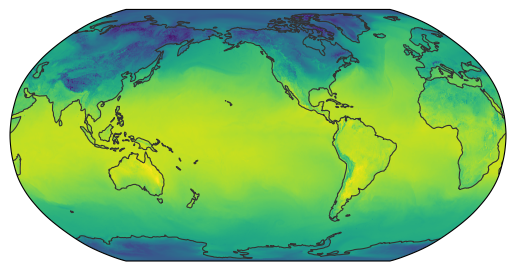

In [27]:
egh.healpix_show(ds.isel(time=0).tas)

In [141]:
def plot_all_fields(ds_plot):
    zoom = int(np.log2(ds_plot.crs.attrs['healpix_nside']))
    projection = ccrs.Robinson(central_longitude=0)
    rows = maths.ceil(len(ds_plot.data_vars) / 4)
    fig, axes = plt.subplots(rows, 4, figsize=(30, rows * 20 / 6), subplot_kw={'projection': projection}, layout='constrained')
    if 'pressure' in ds_plot.coords:
        plt.suptitle(f'{ds.simulation} z{zoom} @{float(ds_plot.pressure)}hPa')
    else:
        plt.suptitle(f'{ds.simulation} z{zoom}')
            
    for ax, (name, da) in zip(axes.flatten(), ds_plot.data_vars.items()):
        time = pd.Timestamp(ds.time.values[0])
    
        if abs(da.max() + da.min()) / (da.max() - da.min()) < 0.5:
            # data looks like it needs a diverging cmap.
            # figure out some nice bounds.
            pl, pu = np.percentile(da.values[~np.isnan(da.values)], [2, 98])
            vmax = np.abs([pl, pu]).max()
            kwargs = dict(
                cmap='bwr',
                vmin=-vmax,
                vmax=vmax,
            )
        else:
            kwargs = {}
        ax.set_title(f'time: {time} - {name}')
        ax.set_global()
        im = egh.healpix_show(da, ax=ax, **kwargs);
        long_name = da.long_name
            
        plt.colorbar(im, label=f'{long_name} ({da.attrs.get("units", "-")})')
        ax.coastlines()

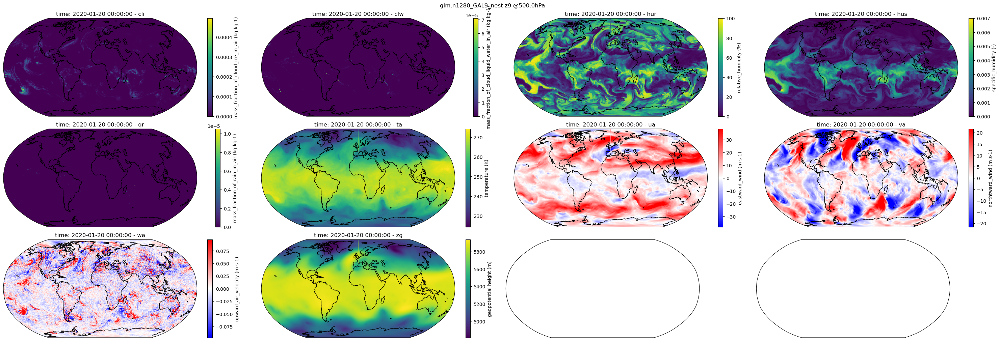

In [138]:
plot_all_fields(cat(sim='glm.n1280_GAL9_nest', freq='PT3H', zoom=9).to_dataset().sel(time=pd.Timestamp('2020-01-20 03:00'), pressure=500))

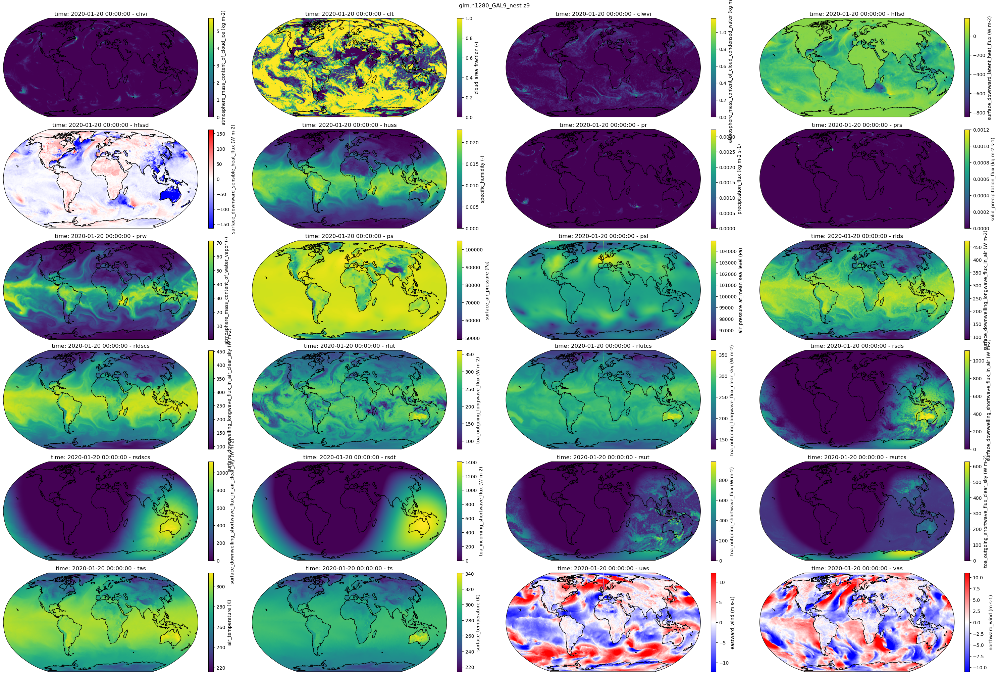

In [137]:
plot_all_fields(cat(sim='glm.n1280_GAL9_nest', freq='PT1H', zoom=9).to_dataset().sel(time=pd.Timestamp('2020-01-20 03:00')))

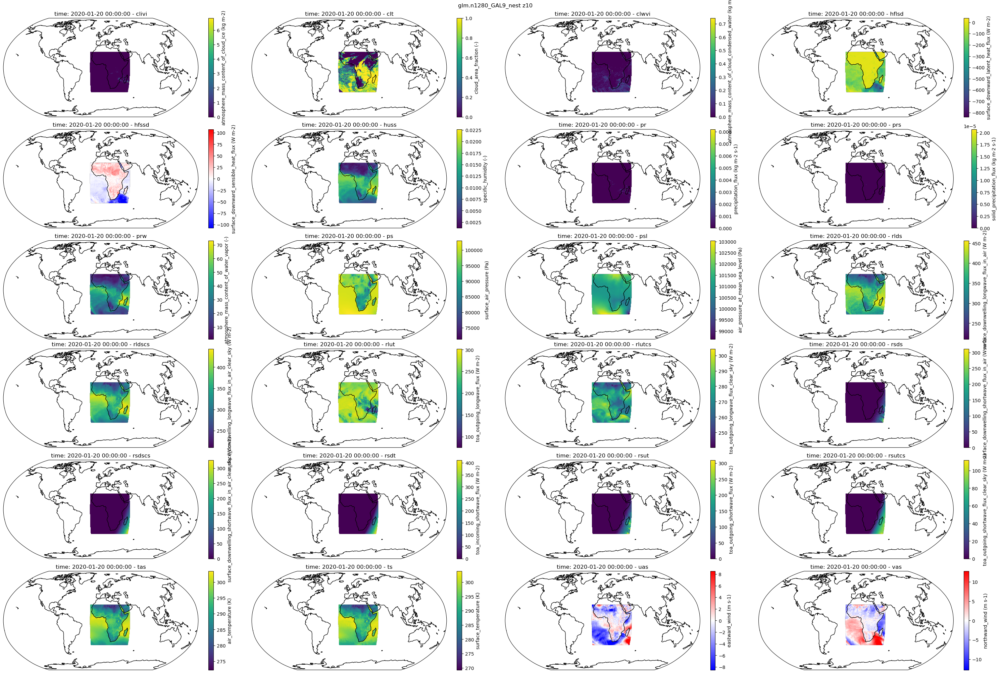

In [142]:
plot_all_fields(cat(sim='Africa_km4p4_CoMA9_TBv1.n1280_GAL9_nest', freq='PT1H', zoom=10).to_dataset().sel(time=pd.Timestamp('2020-01-20 03:00')))

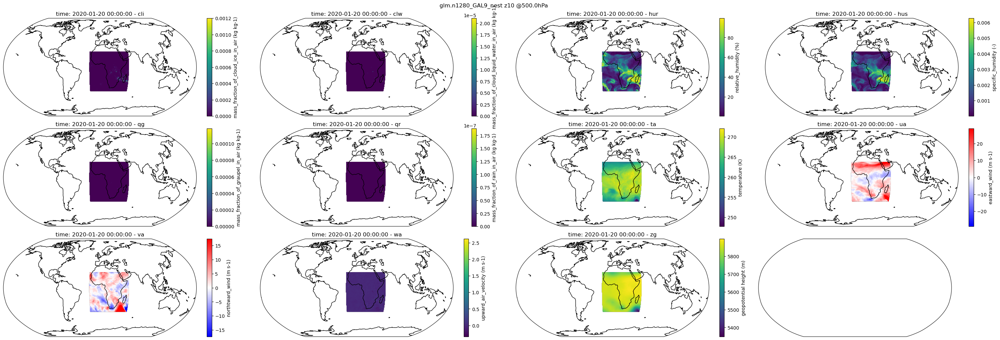

In [143]:
plot_all_fields(cat(sim='Africa_km4p4_CoMA9_TBv1.n1280_GAL9_nest', freq='PT3H', zoom=10).to_dataset().sel(time=pd.Timestamp('2020-01-20 03:00'), pressure=500))

In [189]:
dss = {}
for sim in sims:
    zoom = 9 if 'glm.n1280' in sim else 10
    #zoom = 10
    try:
        dss[sim] = cat(sim=sim, freq='PT1H', zoom=zoom).to_dataset()
    except:
        print(f'Could not load {sim}')

Could not load glm.n1280_CoMA9


In [190]:
def sorter(sim):
    if 'glm.n2560' in sim:
        return 'A'
    elif 'glm.n1280' in sim:
        return 'AA'
    else:
        return sim

In [191]:
dss = {s: dss[s] for s in sorted(dss.keys(), key=sorter)}


In [196]:
def plot_var(plot_dss, var, time, **plot_kwargs):
    rows = maths.ceil(len(plot_dss) / 3)
    projection = ccrs.Robinson(central_longitude=0)
    fig, axes = plt.subplots(rows, 3, figsize=(30, 5 * rows), subplot_kw={'projection': projection}, layout='constrained')
            
    for ax, (name, ds) in zip(axes.flatten(), plot_dss.items()):
        time = pd.Timestamp(ds.time.values[0])
        da = ds[var].sel(time=time)
    
        if abs(da.max() + da.min()) / (da.max() - da.min()) < 0.5:
            # data looks like it needs a diverging cmap.
            # figure out some nice bounds.
            pl, pu = np.percentile(da.values[~np.isnan(da.values)], [2, 98])
            vmax = np.abs([pl, pu]).max()
            kwargs = dict(
                cmap='bwr',
                vmin=-vmax,
                vmax=vmax,
            )
        else:
            kwargs = {}
        kwargs.update(plot_kwargs)
        ax.set_title(f'time: {time} - {name}')
        ax.set_global()
        im = egh.healpix_show(da, ax=ax, **kwargs);
        long_name = da.long_name
            
        plt.colorbar(im, label=f'{long_name} ({da.attrs.get("units", "-")})')
        ax.coastlines()

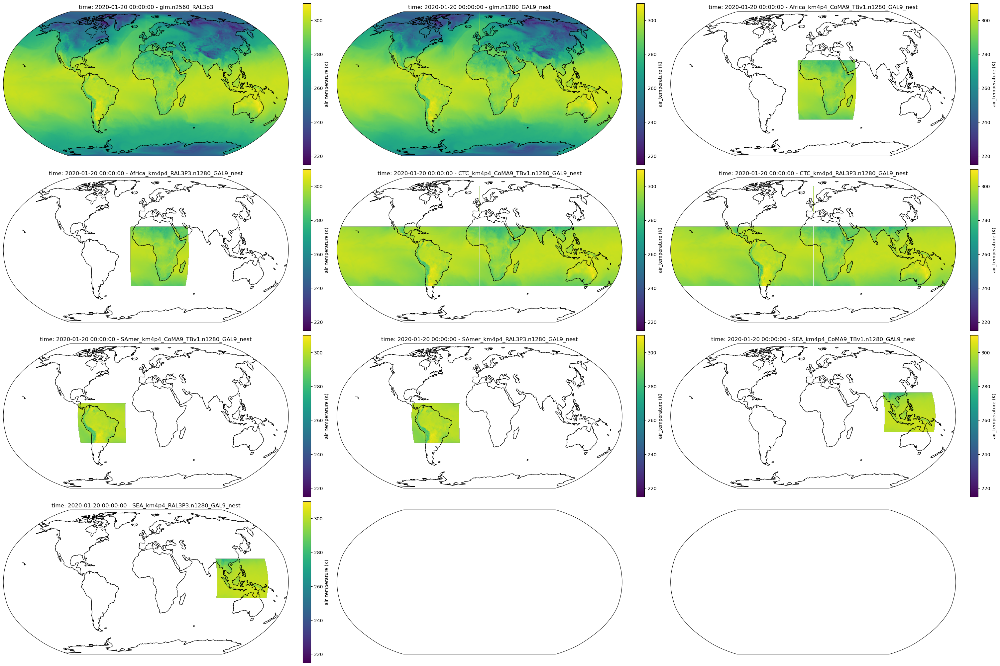

In [200]:
plot_var(dss, 'tas', pd.Timestamp('2020-01-20 10:00'), vmin=215, vmax=310)